# DATA 512 Final Project

## Motivation

In the US, the tensions between the public and the police force have been escalating in recent times. Studies and articles give strong evidence of systemic racism [[1]]( https://edition.cnn.com/2019/03/21/us/police-stops-race-stanford-study-trnd/index.html) [[2]](https://www.themarshallproject.org/2016/06/21/are-traffic-stops-prone-to-racial-bias). This analysis hopes to shed some light on the interactions between the public and the cops through data on 'police stops'. The study investigates if there is any evidence of bias against a certain ethnicity or gender?
The aim of the analysis is to identify any systemic bias that might exist in the police force to provide lawmakers and media the required background to make a fairer society.

## Data

The data is obtained through the [Stanford Open Policing Project](https://openpolicing.stanford.edu/). The data (>200 million records) contains separate csv files for numerous cities and towns across the US. Each row contains data about a police stop, such as the date, purpose of stop, outcome, subject related attributes (like race, age, gender), vehicle type and optionally (only some of the files) location coordinates. Specific information about the files can be found [here](https://github.com/stanford-policylab/opp/blob/master/data_readme.md).

The data is publicly available for download [here](https://openpolicing.stanford.edu/data/) under the [Open Data Commons Attribution License](https://opendatacommons.org/licenses/by/summary/)

Note: Larger number of stops for a particular community need not point to bias immediately as they could be genuine stops. For instance, teenagers may be stopped more frequently because they are infact driving at faster speeds. This analysis aims to identify bias while keeping in mind such constraints.

## Unknowns

The entire dataset is too large and might pose a problem for storage and processing on a local machine. It might be sufficient to limit the analysis to only a few states or cities depending on the time constraints and the depth of the analysis performed. 

## Research Questions
<b> 
1) How are the stop rates distributed across races and genders? <br> </b>
    In particular, are some groups more likely to be stopped? Explore further by breaking down this distribution for two cities, San Francisco, CA and Hartford, CT <br>
<b>    
2) Are stop rates impacted by the time of the day and/or day of the week?
</b> <br> It would be interesting to answer questions like, "In San Francisco, are stop rates highest on a Saturday and what is most common cause of a stop?" <br> 

<b> 3) What is the distribution of search rates (among the stopped vehicles) for different races? </b> <br>
I hypothesize that black and hispanice drivers will have higher search rates than white drivers.

## Background/Related Work

Over 50,000 Americans are stopped by the police everyday [1]. The [Stanford Open Policing Project](https://openpolicing.stanford.edu/) was thus started to create a nation-wide comprehensive repository of police and public interactions. The project has successfully used the data to explore questions such as "Are police stops biased towards a particular community?", "Did legalizing Marijuana cause a drop in search rates?".

The analysis reveals that black and hispanic communities are the victims of racial bias in police stops. A recent [paper](https://www.nature.com/articles/s41562-020-0858-1) provides information about the methods employed.


## Methodology

The downloaded data will be assessed for completeness of demographic information and coordinate availability to identify 2-3 cities that will be used for this analysis. The study will utilize map visualizations to present the differences across states/cities. 

Joins, filters, and group bys will be used to explore and extract relevant aggregates from the dataset. External data about population distributions will be combined with the data to understand relative search rates compared to the population distribution in a state for an accurate understanding of bias.


## Analysis

Import the required libraries

In [1]:
import urllib.request
import zipfile
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import geopandas as gpd
import math
from sklearn.linear_model import LogisticRegression

### Ingesting the data
Function to download the data file given the city url

In [2]:
def download_file(city_url,target_dir='data'):
    '''args
    city_url: Provide the name of the city file to download
    target_dir: directory name of destination files, default is 'data'
    '''
    url = 'https://stacks.stanford.edu/file/druid:yg821jf8611/' #common url
    urllib.request.urlretrieve(url + city_url, f'{target_dir}/{city_url}')
    #unzip the compressed file
    with zipfile.ZipFile(f"{target_dir}/{city_url}","r") as zip_ref:
        zip_ref.extractall(f"{target_dir}")
    #delete the zip file after extraction
    os.remove(f"{target_dir}/{city_url}")

Create a data directory if it does not exist

Download the data for San Francisco, CA and Hartford, CT (1 east, 1 west coast). Subset the San Francisco data to include data after January 2013 and replace the file in the data folder. We will only be looking at the 2013-2016 period for both the cities.

In [3]:
#if data folder does not exist, create it and download the needed files
if not os.path.exists('data'):
    os.makedirs('data')
    
    city_list = ['yg821jf8611_ca_san_francisco_2020_04_01.csv.zip',
                 'yg821jf8611_ct_hartford_2020_04_01.csv.zip']

    for file_name in city_list:
        download_file(file_name)

    req_file = 'data/ca_san_francisco_2020_04_01.csv'
    df_sf = pd.read_csv(req_file, low_memory=False)
    df_sf = df_sf[df_sf.date>='2013-01-01'] #filter file and update the stored csv
    os.remove(req_file)
    df_sf.to_csv(req_file)

### Data Preprocessing

Read in the required files

In [2]:
#read in the stop data
df_sf = pd.read_csv('data/ca_san_francisco_2020_04_01.csv',low_memory=False)
df_hf = pd.read_csv('data/ct_hartford_2020_04_01.csv')
#read in demographic data for SF and Hartford
demo_sf = pd.read_csv('data/san_francisco_2015_demo.csv')
demo_hf = pd.read_csv('data/hartford_2015_demo.csv')
#create a new column with city name
df_sf['city'], df_hf['city'] = 'San Francisco','Hartford'
#merge both the dataframes
df = pd.concat([df_sf,df_hf])

Explore the traffic stops in Hartford to identify the county (boundaries) for which population data is needed.

In [5]:
#create a map
this_map = folium.Map(prefer_canvas=True)

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    folium.CircleMarker(location=[point.lat, point.lng],
                        radius=1,
                        weight=3).add_to(this_map)

#use df.apply(,axis=1) to "iterate" through every row in your dataframe
df_hf[['lat','lng']].dropna().apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
#this_map.save('html_map_output/simple_dot_plot.html')

this_map

Looks like majority of the stops are concentrated in Hartford city and I only procure the demographic data for Hartford city, which is stored in "data/hartford_2015_demo.csv". Similar exploration is performed for San Francisco.

## Research Question 1
#### Distribution by ethnicity
What is the distribution of stops for different ethnicities (raw and normalized by population) in San Francisco and Hartford? 

In [6]:
##Function to calculate percentages of population for each race 
def calc_percentages_race(demo):
    '''args
    demo: demographic dataframe of a city
    returns dataframe with race vs percentage columns
    '''
    data = []
    data.append(['white',float(demo['White']/demo['Total population'])])
    data.append(['black',float(demo['Black']/demo['Total population'])])
    data.append(['hispanic',float(demo['Hispanic']/demo['Total population'])])
    data.append(['asian/pacific islander',float((demo['Asian']+demo['Native Hawaiian and Other Pacific Islander'])/demo['Total population'])])
    data.append(['other',float((demo['Some other race']+demo['American Indian']+demo['Two or more races'])/demo['Total population'])])
    return pd.DataFrame(data, columns=['subject_race','population proportion'])

##call the function for SF and Hartford
pop_sf = calc_percentages_race(demo_sf)
pop_hf = calc_percentages_race(demo_hf)

Plot the stop distribution and ethnicity distribution in both the cities

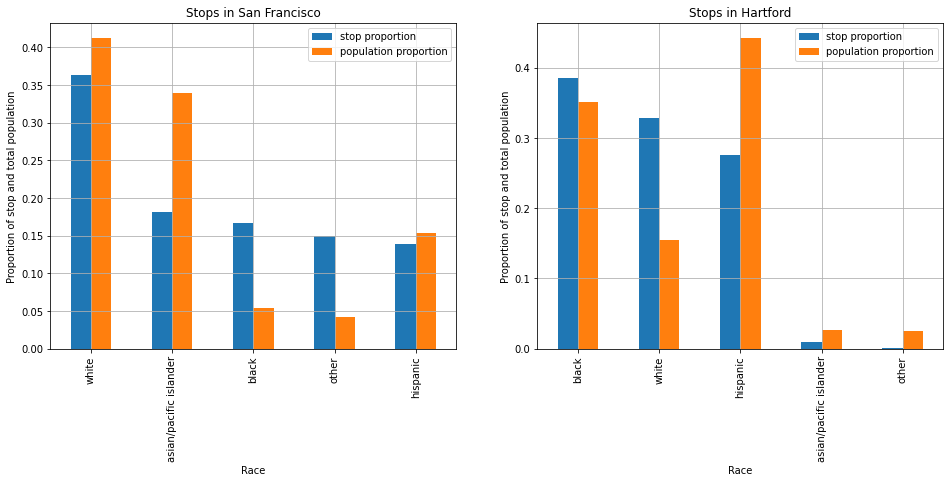

In [8]:
#count stop percentage for each ethnicity 
hist_sf=df_sf['subject_race'].value_counts(normalize=True).rename_axis('subject_race').reset_index(name='stop proportion')
hist_hf=df_hf['subject_race'].value_counts(normalize=True).rename_axis('subject_race').reset_index(name='stop proportion')

#combine population percentages with stop percentage by ethnicity
temp_sf = pd.merge(hist_sf,pop_sf, on='subject_race')
temp_hf = pd.merge(hist_hf,pop_hf, on='subject_race')

##plot figure
fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

temp_sf.plot('subject_race',['stop proportion','population proportion'], kind='bar',ax=ax1)
ax1.set_ylabel('Proportion of stop and total population')
ax1.set_xlabel('Race')
ax1.set_title('Stops in San Francisco')
ax1.grid()

temp_hf.plot('subject_race',['stop proportion','population proportion'], kind='bar',ax=ax2)
ax2.set_ylabel('Proportion of stop and total population')
ax2.set_xlabel('Race')
ax2.set_title('Stops in Hartford')
ax2.grid()
plt.savefig('images/stop_dist.png')

In San Francisco, even though black people only make up about 5% of the population, they make up 17% of the stops. In Hartford, such a pattern is not observed. This needs to be investigated further. Let us see how the stops look when normalized by the corresponding populations for a particular ethnicity.

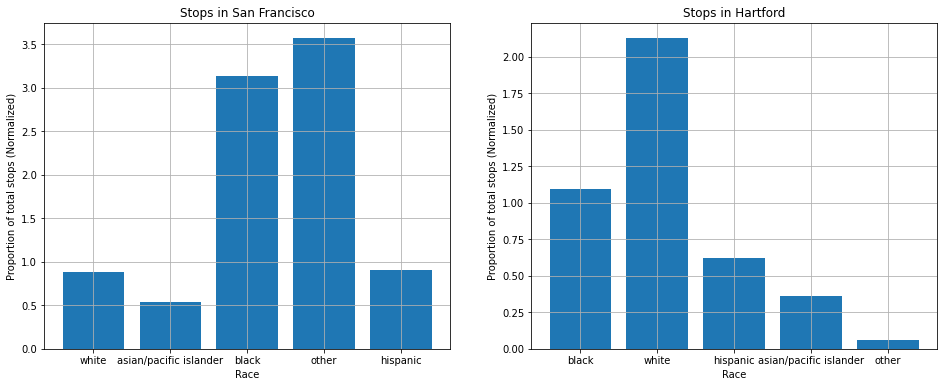

In [9]:
fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

#normalize by population proportion
ax1.bar(temp_sf['subject_race'],temp_sf['stop proportion']/temp_sf['population proportion']) 
ax1.set_ylabel('Proportion of total stops (Normalized)')
ax1.set_xlabel('Race')
ax1.set_title('Stops in San Francisco')
ax1.grid()

#normalize by population proportion
ax2.bar(temp_hf['subject_race'],temp_hf['stop proportion']/temp_hf['population proportion'])
ax2.set_ylabel('Proportion of total stops (Normalized)')
ax2.set_xlabel('Race')
ax2.set_title('Stops in Hartford')
ax2.grid()
plt.savefig('images/stop_dist_norm.png')

In San Francisco, black people are stopped 3 times higher than their population proportion. In Hartford, white people are stopped 2 times higher than their population proportion. Let us dig in further.

Note: Population data is used here as a very rough estimate. Ideally, we should normalize the stops with the number of vehicle owners across the ethnicities. However, there is no such breakdown of data available for the cities at hand. But evidence suggests that minority communities usually have a lower car ownership percentage [[3]](https://nationalequityatlas.org/indicators/Car_access). In which case, the plots above are the best case scenario and in reality the histogram differences will be more exaggerated.

What are the common causes of stops?

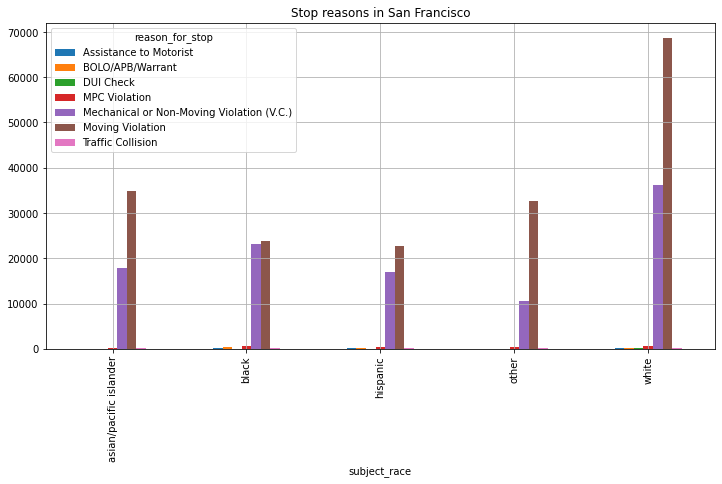

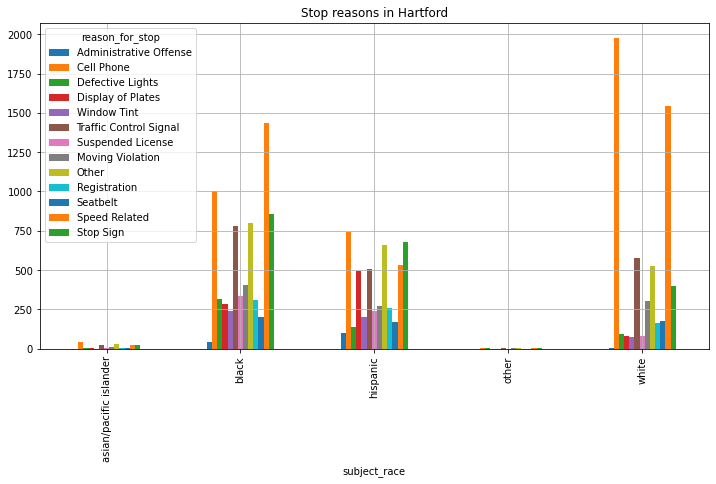

In [10]:
##San Francisco
stop_reasons=['Assistance to Motorist','BOLO/APB/Warrant','DUI Check','MPC Violation',\
              'Mechanical or Non-Moving Violation (V.C.)','Moving Violation','Traffic Collision']

temp = df_sf[df_sf.reason_for_stop.isin(stop_reasons)].groupby(['subject_race','reason_for_stop']).raw_row_number.count().reset_index()
stop_dist=temp.pivot(index='subject_race', columns='reason_for_stop', values='raw_row_number').reset_index()

#plot
stop_dist.plot('subject_race',stop_reasons, kind='bar', figsize=(12,6))
plt.title('Stop reasons in San Francisco')
plt.grid()

##Hartford
stop_reasons=['Administrative Offense','Cell Phone','Defective Lights','Display of Plates',\
              'Window Tint','Traffic Control Signal','Suspended License','Moving Violation',\
             'Other','Registration','Seatbelt','Speed Related','Stop Sign']

temp=df_hf[df_hf.reason_for_stop.isin(stop_reasons)].groupby(['subject_race','reason_for_stop']).raw_row_number.count().reset_index()
stop_dist=temp.pivot(index='subject_race', columns='reason_for_stop', values='raw_row_number').reset_index()

#plot
stop_dist.plot('subject_race',stop_reasons, kind='bar', figsize=(12,6))
plt.title('Stop reasons in Hartford')
plt.grid()
plt.savefig('images/stop_reasons_sf.png')

in San Francisco, black people are stopped way more often due to non moving violations whereas the most common cause for stops for white and asian population is moving violations (speed related). This does not point to anything conclusively, but there is an obvious difference in pattern for stop reasons for Black people. 
The stop reasons are different in Hartford. 

Let us also briefly investigate gender distribution
#### Distribution by gender

In [11]:
def calc_percentages_gender(demo):
    '''args
    demo: demographic dataframe for a city
    returns dataframe with sex vs population proportion
    '''
    data = []
    data.append(['male',float(demo['Male']/demo['Total population'])])
    data.append(['female',float(demo['Female']/demo['Total population'])])
    return pd.DataFrame(data, columns=['subject_sex','population proportion'])

#call the function for both the cities
pop_sf = calc_percentages_gender(demo_sf)
pop_hf = calc_percentages_gender(demo_hf)

Plot the stop distribution and gender distribution in both the cities

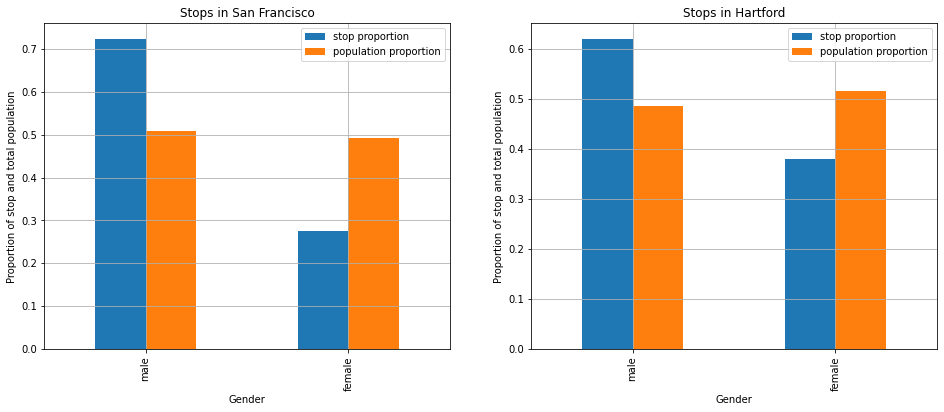

In [12]:
hist_sf=df_sf['subject_sex'].value_counts(normalize=True).rename_axis('subject_sex').reset_index(name='stop proportion')
hist_hf=df_hf['subject_sex'].value_counts(normalize=True).rename_axis('subject_sex').reset_index(name='stop proportion')

temp_sf = pd.merge(hist_sf,pop_sf, on='subject_sex')
temp_hf = pd.merge(hist_hf,pop_hf, on='subject_sex')

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

temp_sf.plot('subject_sex',['stop proportion','population proportion'], kind='bar',ax=ax1)
ax1.set_ylabel('Proportion of stop and total population')
ax1.set_xlabel('Gender')
ax1.set_title('Stops in San Francisco')
ax1.grid()

temp_hf.plot('subject_sex',['stop proportion','population proportion'], kind='bar',ax=ax2)
ax2.set_ylabel('Proportion of stop and total population')
ax2.set_xlabel('Gender')
ax2.set_title('Stops in Hartford')
ax2.grid()
plt.savefig('images/gender_dist.png')

Men were stopped more often than woman for similar population distributions in both the cities 
### Research Question 2
First, create the required columns for day of the week, hour of the day

In [3]:
#Hartford
df_hf['day']=pd.to_datetime(df_hf['date']).dt.day_name() #get day of the week from date
df_hf['hour']=df_hf['time'].str[:2]
df_hf['year']=pd.to_datetime(df_hf['date']).dt.year #year of the incident

#San Francisco
df_sf['day']=pd.to_datetime(df_sf['date']).dt.day_name()
df_sf['hour']=df_sf['time'].str[:2]
df_sf['year']=pd.to_datetime(df_sf['date']).dt.year

Function to plot average stops per day of the week or average stops per hour of the day

In [4]:
def plot_periodic(df_sf,df_hf,granularity='day'):
    '''args
    df_sf: SF dataframe
    df_hf: Hartford dataframe
    granularity: frequency of the output plot
    '''
    #San francisco
    t_sf=df_sf.groupby(['year',granularity,'date']).count().reset_index()
    tt_sf = t_sf[['year',granularity,'date']].groupby(['year',granularity]).count().reset_index()

    dow_sf = df_sf[['year',granularity,'raw_row_number']].groupby(['year',granularity]).count().reset_index()
    dow_sf_n = pd.merge(dow_sf,tt_sf,on=['year',granularity])
    dow_sf_n['avg_stops']=dow_sf_n['raw_row_number']/dow_sf_n['date'] #get average number of stops

    #Hartford
    t_hf=df_hf.groupby(['year',granularity,'date']).count().reset_index()
    tt_hf = t_hf[['year',granularity,'date']].groupby(['year',granularity]).count().reset_index()

    dow_hf = df_hf[['year',granularity,'raw_row_number']].groupby(['year',granularity]).count().reset_index()
    dow_hf_n = pd.merge(dow_hf,tt_hf,on=['year',granularity])
    dow_hf_n['avg_stops']=dow_hf_n['raw_row_number']/dow_hf_n['date'] #get average number of stops

    #plot
    fig, [ax1,ax2] = plt.subplots(1,2,figsize=(18,6))
    sns.pointplot(data=dow_sf_n,x=granularity,y='avg_stops',hue='year',ax=ax1,s=100)
    ax1.set_title('San Francisco')
    ax1.grid()
    ax1.set_ylabel('Average Number of Stops')

    sns.pointplot(data=dow_hf_n,x=granularity,y='avg_stops',hue='year',ax=ax2,s=100)
    ax2.set_title('Hartford')
    ax2.grid()
    ax2.set_ylabel('Average Number of Stops')

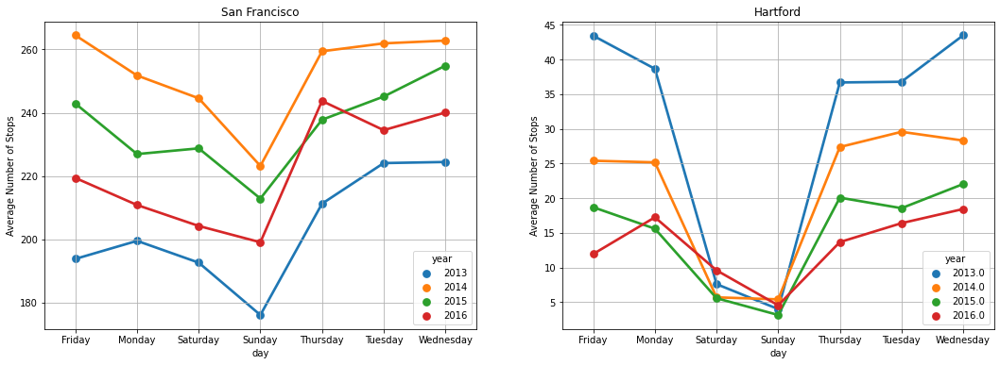

In [5]:
plot_periodic(df_sf,df_hf,'day')
plt.savefig('images/dow_dist.png')

In San Francisco, Sunday has the least number of stops on average and Wednesday's have the most followed by Fridays. Hartford also follows a similar pattern. How does the stop pattern look across hours of the day?

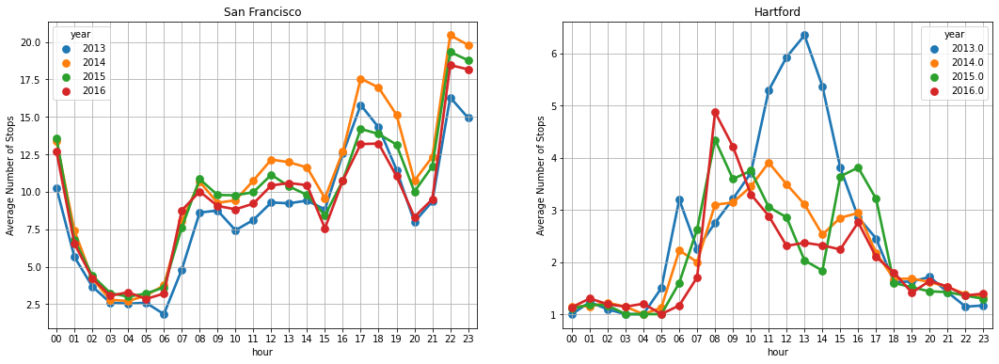

In [6]:
plot_periodic(df_sf,df_hf,'hour')
plt.savefig('images/tod_dist.png')

San Francisco has a similar pattern across the years with peaks around 5PM (end of work time) and 10PM. Hartford has a more noisy pattern but most of the stops in Hartford seem to concentrate between 8AM - 1PM and are very minimal in the evenings and nights.

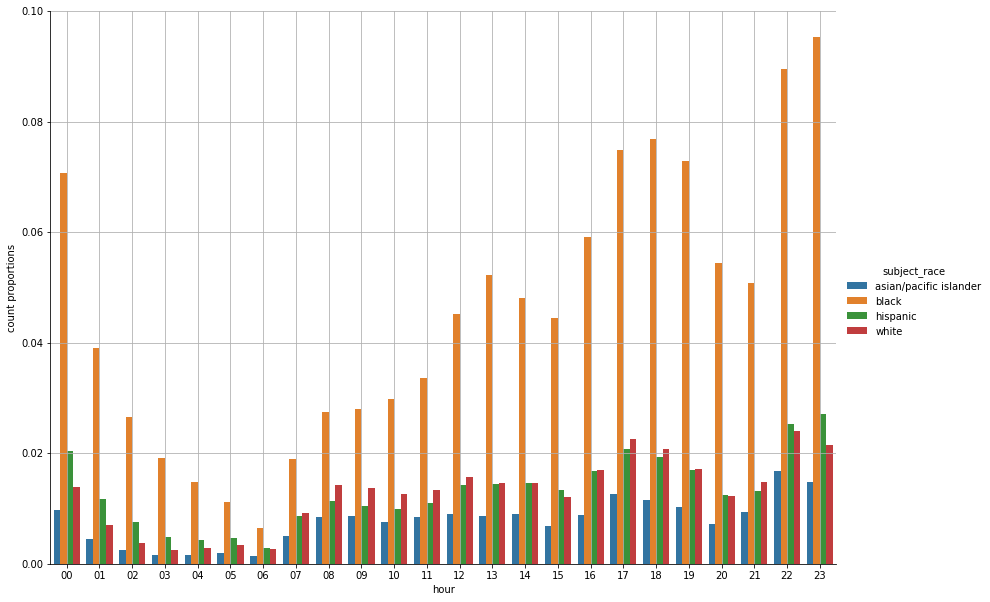

In [7]:
temp = pd.DataFrame()
# temp['subject_race'] = ['white','asian/pacific islander','black','hispanic','other']
# temp['total_value'] = [int(demo_sf['White']),int(demo_sf['Asian']+demo_sf['Native Hawaiian and Other Pacific Islander']),
#                        int(demo_sf['Black']),int(demo_sf['Hispanic']),
#                        int(demo_sf['American Indian']+demo_sf['Some other race']+demo_sf['Two or more races'])]

temp['subject_race'] = ['white','asian/pacific islander','black','hispanic']
temp['total_value'] = [int(demo_sf['White']),int(demo_sf['Asian']+demo_sf['Native Hawaiian and Other Pacific Islander']),
                       int(demo_sf['Black']),int(demo_sf['Hispanic'])
                      ]

x=df_sf[['hour','subject_race','raw_row_number']].groupby(['hour','subject_race']).count().reset_index()
time_race = pd.merge(x,temp, on='subject_race')
time_race['count proportions']=time_race['raw_row_number']/time_race['total_value']
sns.catplot(x = "hour",       # x variable name
            y = "count proportions",       # y variable name
            hue = "subject_race",  # group variable name
            data = time_race,     # dataframe to plot
            kind = "bar",
            height=8.27, aspect=11.7/8.27)
plt.grid()
plt.savefig('images/tod_race_dist.png')

The results are inconclusive

### Research Question 3
So far, there is a difference in distributions of races but does not clearly point out any bias. Next I investigate the search rate (searches/stops) across the races in each city.

Search rates and confidence interval in San Francisco, CA


,subject_race,mean,std,count,u_ci,l_ci
0,asian/pacific islander,0.013146,0.113901,53020,0.014116,0.012176
1,black,0.154880,0.361794,48896,0.158087,0.151673
2,hispanic,0.063421,0.243722,40696,0.065789,0.061053
3,other,0.018421,0.134469,43755,0.019681,0.017161
4,white,0.021008,0.143412,106102,0.021871,0.020145


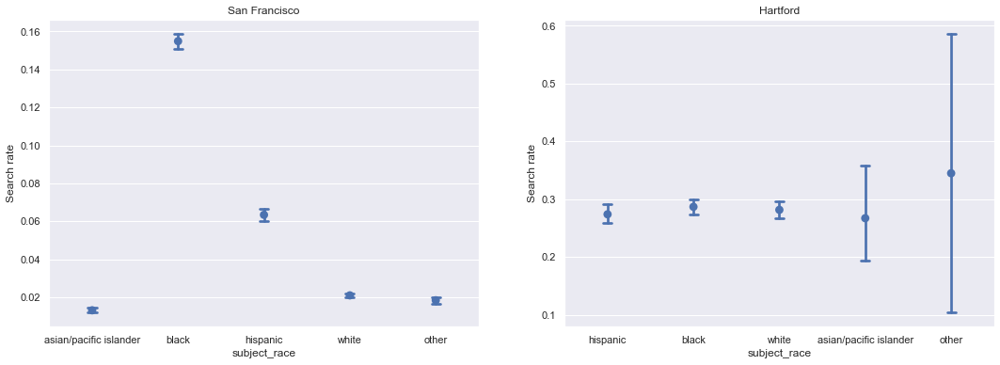

In [9]:
#hartford get the mean, std and count of searches for each race
search_hf = df_hf[['subject_race','search_conducted']].groupby('subject_race').\
agg({'search_conducted':['mean','std','count']}).\
xs('search_conducted', axis=1, drop_level=True).reset_index()
#calculate the confidence intervals
search_hf['u_ci']= search_hf['mean']+1.96*(search_hf['std']/np.sqrt(search_hf['count']))
search_hf['l_ci']= search_hf['mean']-1.96*(search_hf['std']/np.sqrt(search_hf['count']))

#plot
fig, [ax1,ax2] = plt.subplots(1,2,figsize=(18,6))
sns.set_theme(style="darkgrid")

sns.pointplot(x='subject_race',y='search_conducted',data=df_hf,ax=ax2, join=False, ci=99,capsize=.1)
ax2.set_title('Hartford')
ax2.set_ylabel('Search rate')

#San Francisco
search_sf = df_sf[['subject_race','search_conducted']].groupby('subject_race').\
agg({'search_conducted':['mean','std','count']}).\
xs('search_conducted', axis=1, drop_level=True).reset_index()
#calculate confidence interval
search_sf['u_ci']= search_sf['mean']+1.96*(search_sf['std']/np.sqrt(search_sf['count']))
search_sf['l_ci']= search_sf['mean']-1.96*(search_sf['std']/np.sqrt(search_sf['count']))

sns.pointplot(x='subject_race',y='search_conducted',data=df_sf,  ax= ax1, join=False, ci=99,capsize=.1)
ax1.set_title('San Francisco')
ax1.set_ylabel('Search rate')
plt.savefig('images/search_rates.png')
print('Search rates and confidence interval in San Francisco, CA')
search_sf #table to show difference in search rates in San Francisco

Although there is no strong evidence of difference in search rates in Hartford, San Francisco paints a different picture. Black people have extremely high search rates followed by hispanic. For black people, the search rate is about 8 times higher than white and for hispanic it is 3 times higher.

Hartford also provides shapefiles. I wish to see the distribution of search rates across various counties.

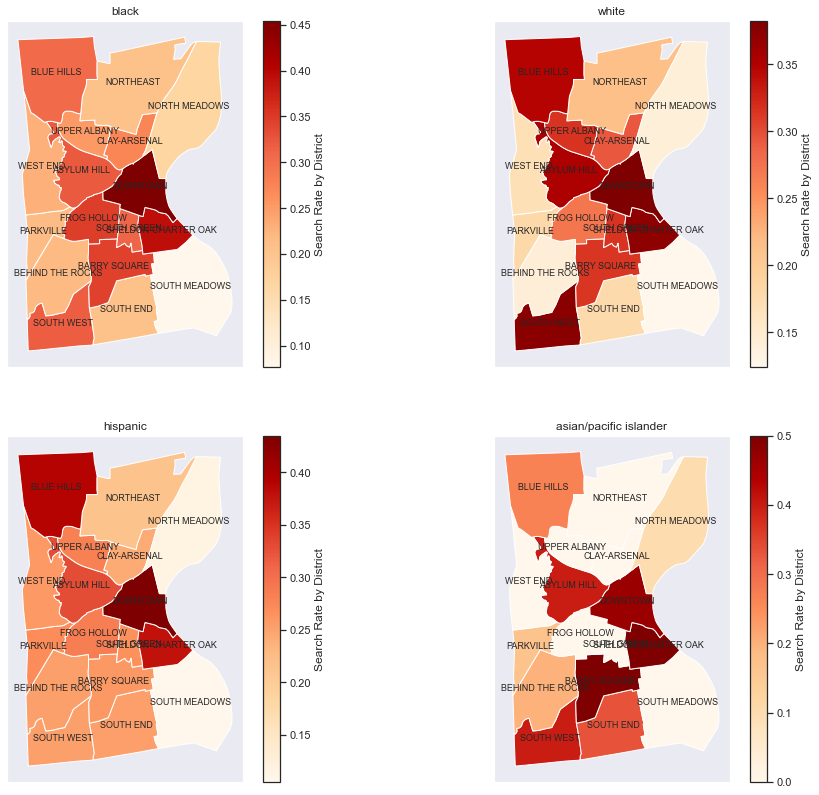

In [10]:
#read in shape file
lsoas = gpd.read_file('data/ct_hartford_shapefiles/Hartford_Neighborhoods.shp')

def map_ethnicity(df,lsoas,race,ax):
    '''args
    df - dataframe with search rate
    lsoas - geopandas dataframe with polygon geometries
    race - race to plot for
    ax - position of plot
    '''
    temp = df[df.subject_race==race]
    x = temp[['district','search_conducted']].groupby('district').mean().reset_index()
    x=x.rename(columns={"district":"NAME"})
    out=pd.merge(lsoas,x,on='NAME') #merge on district
    
    #plot the graphs
    out.plot(column='search_conducted',ax=ax,cmap='OrRd',
         legend=True,
        legend_kwds={'label': "Search Rate by District"})
    out.apply(lambda x: ax.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],
                                                                fontsize=9,
                                                           ha='center'),axis=1)   
    ax.set_title(race)
    ax.set_xticks([])
    ax.set_yticks([])
    
#create plots for each race
fig, ((ax1, ax2), (ax3, ax4)) =plt.subplots(2,2,figsize=(16, 14))
sns.set_theme(style="white")

map_ethnicity(df_hf,lsoas,'black',ax1)
map_ethnicity(df_hf,lsoas,'white',ax2)
map_ethnicity(df_hf,lsoas,'hispanic',ax3)
map_ethnicity(df_hf,lsoas,'asian/pacific islander',ax4)
plt.savefig('images/spatial_dist.png')

how are the search rates distributed among the years? is there an increase in search rate in a year for one ethnicity?

In [13]:
search_sf_year = df_sf[['year','subject_race','search_conducted']].groupby(['year','subject_race']).\
agg({'search_conducted':['mean','std','count']}).\
xs('search_conducted', axis=1, drop_level=True).reset_index()

search_sf_year['u_ci']= search_sf_year['mean']+1.96*(search_sf_year['std']/np.sqrt(search_sf['count']))
search_sf_year['l_ci']= search_sf_year['mean']-1.96*(search_sf_year['std']/np.sqrt(search_sf['count']))


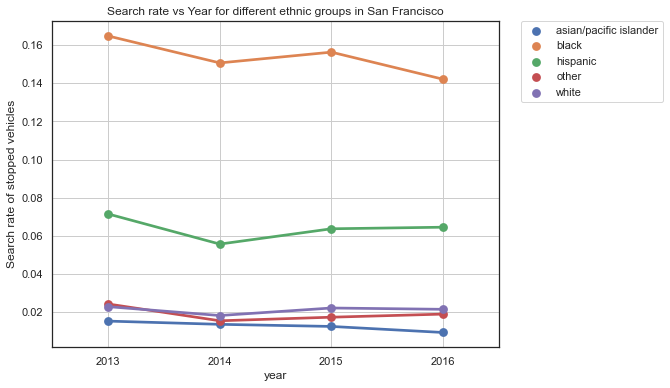

In [14]:
fig, ax = plt.subplots(figsize=(8,6))
sns.pointplot(data=search_sf_year,x='year',y='mean',hue='subject_race',ax=ax,s=100)
plt.grid()
plt.ylabel('Search rate of stopped vehicles')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Search rate vs Year for different ethnic groups in San Francisco')
plt.savefig('images/search_year_dist.png')

In [15]:
df_sf['contraband_found']=df_sf['contraband_found'].fillna(False)
ll = df_sf[['subject_race','contraband_found','reason_for_stop','search_conducted']]
xx = ll[ll['search_conducted']==True].copy()
xx['out']=xx['contraband_found'].astype(int)

xx.groupby('subject_race').out.mean()

subject_race
asian/pacific islander    0.375897
black                     0.109336
hispanic                  0.153816
other                     0.217122
white                     0.275011
Name: out, dtype: float64

In [16]:
df_hf['contraband_found']=df_hf['contraband_found'].fillna(False)
ll = df_hf[['subject_race','contraband_found','reason_for_stop','search_conducted']]
xx = ll[ll['search_conducted']==True].copy()
xx['out']=xx['contraband_found'].astype(int)

xx.groupby('subject_race').out.mean()

subject_race
asian/pacific islander    0.000000
black                     0.017182
hispanic                  0.017999
other                     0.000000
white                     0.012317
Name: out, dtype: float64

In [17]:
pd.get_dummies(df_sf.subject_race).head()
df_sf_temp = df_sf.merge(pd.get_dummies(df_sf.subject_race), left_index=True, right_index= True )
X=df_sf_temp[['asian/pacific islander','black','hispanic','other']]
y=df_sf_temp['search_conducted']
clf = LogisticRegression(random_state=0).fit(X, y)
clf.score(X, y)
clf.coef_

array([[-0.47739898,  2.14313985,  1.14743612, -0.13522606]])

### Findings

### Limitations


## References
[1] https://edition.cnn.com/2019/03/21/us/police-stops-race-stanford-study-trnd/index.html <br>
[2] https://www.themarshallproject.org/2016/06/21/are-traffic-stops-prone-to-racial-bias <br>
[3] https://nationalequityatlas.org/indicators/Car_access